In [2]:
using Pkg; Pkg.activate(".")

  Activating project at `~/Files/Codigos/repos/SequentialCompression/paper/experiments`


In [3]:
using CairoMakie

In [7]:
CairoMakie.activate!()
const USE_GPU = false  # Use GPU? If this is set false, then no GPU needs to be available
using ParallelStencil
using ParallelStencil.FiniteDifferences2D
using SequentialCompression
@static if USE_GPU
    @init_parallel_stencil(CUDA, Float64, 2)
else
    @init_parallel_stencil(Threads, Float64, 2)
end
using Printf, Statistics
using JSON

@parallel function compute_V!(Vx::Data.Array, Vy::Data.Array, P::Data.Array, dt::Data.Number, ρ::Data.Number, dx::Data.Number, dy::Data.Number)
    @inn(Vx) = @inn(Vx) - dt/ρ*@d_xi(P)/dx
    @inn(Vy) = @inn(Vy) - dt/ρ*@d_yi(P)/dy
    return
end

@parallel function compute_P!(P::Data.Array, Vx::Data.Array, Vy::Data.Array, dt::Data.Number, k::Data.Number, dx::Data.Number, dy::Data.Number)
    @all(P) = @all(P) - dt*k*(@d_xa(Vx)/dx + @d_ya(Vy)/dy)
    return
end

##################################################
@views function acoustic2D()
    # Physics
    lx, ly    = 50.0, 50.0  # domain extends
    k         = 1.0         # bulk modulus
    ρ         = 1.0         # density
    t         = 0.0         # physical time
    # Numerics
    nx, ny    = 255, 255    # numerical grid resolution; should be a mulitple of 32-1 for optimal GPU perf
    nt        = 1000        # number of timesteps
    nout      = 10          # plotting frequency
    # Derived numerics
    dx, dy    = lx/(nx-1), ly/(ny-1) # cell sizes
    dx, dy = map(d->round(d, digits=2), (dx, dy))
    # Array allocations
    P         = @zeros(nx  ,ny  )
    Vx        = @zeros(nx+1,ny  )
    Vy        = @zeros(nx  ,ny+1)
    # Initial conditions
    P        .= Data.Array([exp(-((ix-1)*dx-0.5*lx)^2 -((iy-1)*dy-0.5*ly)^2) for ix=1:size(P,1), iy=1:size(P,2)])
    dt        = min(dx,dy)/sqrt(k/ρ)/4.1

    snapshots = SeqCompressor(Float64, nx, ny, inmemory=false)

    # Time loop
    for it = 1:nt
        if (it==11)  global wtime0 = Base.time()  end
        @parallel compute_V!(Vx, Vy, P, dt, ρ, dx, dy)
        @parallel compute_P!(P, Vx, Vy, dt, k, dx, dy)
        append!(snapshots, P)
        t = t + dt
    end
    # Performance
    wtime    = Base.time()-wtime0
    A_eff    = (3*2)/1e9*nx*ny*sizeof(Data.Number)  # Effective main memory access per iteration [GB] (Lower bound of required memory access: H and dHdτ have to be read and written (dHdτ for damping): 4 whole-array memaccess; B has to be read: 1 whole-array memaccess)
    wtime_it = wtime/(nt-10)                        # Execution time per iteration [s]
    T_eff    = A_eff/wtime_it                       # Effective memory throughput [GB/s]
    @printf("Total steps=%d, time=%1.3e sec (@ T_eff = %1.2f GB/s) \n", nt, wtime, round(T_eff, sigdigits=2))

    SequentialCompression.save("wavefield.szfp", snapshots)

    param = Dict("dt" => dt, "dx" => dx, "dy" => dy)
    open("geometry.json", "w") do file
        JSON.print(file, param)
    end

    return
end

acoustic2D()

┌ Warning: ParallelStencil has already been initialized, with the same arguments. If you are using ParallelStencil interactively in the REPL, then you can ignore this message. If you are using ParallelStencil non-interactively, then you are likely using ParallelStencil in an inconsistent way: @init_parallel_stencil should only be called once, right after 'using ParallelStencil'.
└ @ ParallelStencil ~/.julia/packages/ParallelStencil/MlXWR/src/init_parallel_stencil.jl:92
┌ Warning: Module Data from previous module initialization found in caller module (Main); module Data not created. If you are working interactively in the REPL, then you can ignore this message.
└ @ ParallelStencil.ParallelKernel ~/.julia/packages/ParallelStencil/MlXWR/src/ParallelKernel/init_parallel_kernel.jl:48


Total steps=1000, time=7.749e+00 sec (@ T_eff = 0.40 GB/s) 


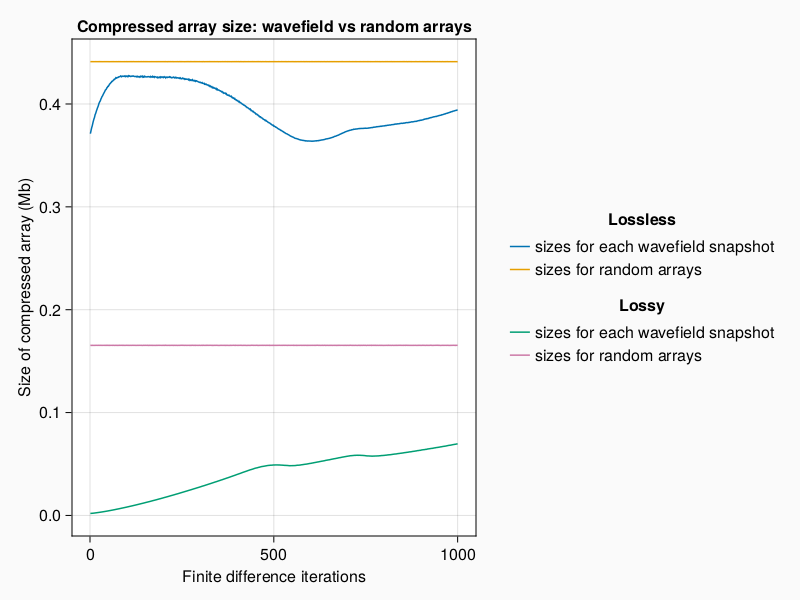

CairoMakie.Screen{PDF}


In [8]:
CairoMakie.activate!()
using SequentialCompression
using ZfpCompression
using Random

struct Sizes
    wave::Vector{Float64}
    random::Vector{Float64}
end

function sizeComp(compress::Function)
    Ac = load("wavefield.szfp")

    sizes = Float64[]
    for i=1:size(Ac)[3]
       push!(sizes, compress(Ac[i]) |> sizeof)
    end

    Random.seed!(1234)

    dims = size(Ac)[1:2]

    create_random_arrays(dims) = rand(dims...)

    sizes_random = Float64[]
    for i=1:size(Ac)[3]
        push!(sizes_random, compress(create_random_arrays(dims)) |> sizeof)
    end

    sizes = map(x -> x/1024^2, sizes)
    sizes_random = map(x -> x/1024^2, sizes_random)

    return Sizes(sizes, sizes_random)
end

sizes_lossless = sizeComp(A -> zfp_compress(A))
sizes_lossy = sizeComp(A -> zfp_compress(A, tol=1e-5))

labels = ["sizes for each wavefield snapshot", "sizes for random arrays"]

fig = Figure(backgroundcolor = RGBf(0.98, 0.98, 0.98))
ax1 = Axis(fig[1:2,1],
          title = "Compressed array size: wavefield vs random arrays",
          xlabel = "Finite difference iterations",
          ylabel = "Size of compressed array (Mb)"
         )

ln1 = lines!(ax1, sizes_lossless.wave)
ln2 = lines!(ax1, sizes_lossless.random)
ln3 = lines!(ax1, sizes_lossy.wave)
ln4 = lines!(ax1, sizes_lossy.random)
legend = Legend(fig, [[ln1, ln2], [ln3, ln4]], [labels, labels], ["Lossless", "Lossy"], framevisible=false)

fig[1:2,2] = legend

display(fig)
CairoMakie.save("../figs/compressedSizeAnalysis.pdf", fig)

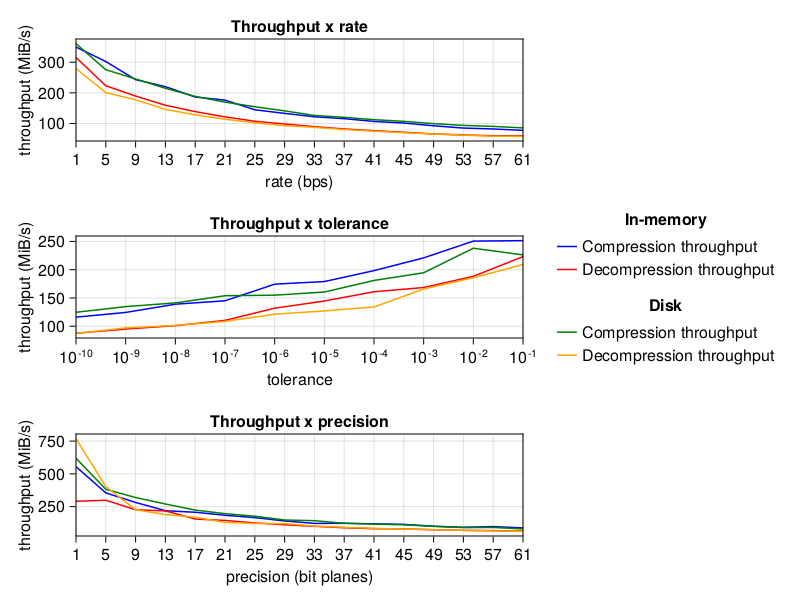

In [9]:
CairoMakie.activate!()
using SequentialCompression
using ZfpCompression
using CairoMakie
using DataFrames

function compressionthroughput(; rate::Int=0, tol::Real=0, precision::Int=0, inmemory::Bool=true)
    dummyData = rand(1000,1000,10)
    cp = SeqCompressor(Float64, 1000, 1000, rate=rate, tol=tol, precision=precision, inmemory=inmemory)

    wtime0 = Base.time()
    for it=1:size(dummyData, 3)
        append!(cp, dummyData[:,:,it])
    end
    wtime    = Base.time()-wtime0

    throughput = sizeof(dummyData) * 1e-6 / wtime
    return throughput, cp
end

function decompressionthroughput(cp)
    wtime0 = Base.time()
    decompData = cp[:]
    wtime    = Base.time()-wtime0

    throughput = sizeof(decompData) * 1e-6 / wtime
    return throughput
end

function throughputs(; rate::Int=0, tol::Real=0, precision::Int=0, inmemory::Bool=true)
    comp_throughput, cp = compressionthroughput(rate=rate, tol=tol, precision=precision, inmemory=inmemory)
    decomp_throughput = decompressionthroughput(cp)
    return comp_throughput, decomp_throughput
end

function rateTest()
    rates = 1:4:64
    df = DataFrame()
    df.rate = rates |> collect

    values = zeros(length(df.rate),2)
    for (i,rate) in enumerate(rates)
        values[i,:] .= throughputs(rate=rate, inmemory=true)
    end

    df.compression_inmemory = values[:, 1]
    df.decompression_inmemory = values[:, 2]

    for (i,rate) in enumerate(rates)
        values[i,:] .= throughputs(rate=rate, inmemory=false)
    end

    df.compression_disk = values[:, 1]
    df.decompression_disk = values[:, 2]

    return df
end

function precisionTest()
    precisions = 1:4:64
    df = DataFrame()
    df.precision = precisions |> collect

    values = zeros(length(df.precision),2)
    for (i,precision) in enumerate(precisions)
        values[i,:] .= throughputs(precision=precision, inmemory=true)
    end

    df.compression_inmemory = values[:, 1]
    df.decompression_inmemory = values[:, 2]

    for (i,precision) in enumerate(precisions)
        values[i,:] .= throughputs(precision=precision, inmemory=true)
    end

    df.compression_disk = values[:, 1]
    df.decompression_disk = values[:, 2]

    return df
end

function tolTest()
    tols = [ 10.0^(-i) for i=1:10 ]
    df = DataFrame()
    df.tol = tols

    values = zeros(length(df.tol),2)
    for (i,tol) in enumerate(tols)
        values[i,:] .= throughputs(tol=tol, inmemory=true)
    end

    df.compression_inmemory = values[:, 1]
    df.decompression_inmemory = values[:, 2]

    for (i,tol) in enumerate(tols)
        values[i,:] .= throughputs(tol=tol, inmemory=false)
    end

    df.compression_disk = values[:, 1]
    df.decompression_disk = values[:, 2]

    return df
end

function plot(df_rate, df_tol, df_precision)
    fig = Figure()
    ax1 = Axis(fig[1,1],
               xlabel="rate (bps)",
               ylabel="throughput (MiB/s)",
               title="Throughput x rate",
               xautolimitmargin=(0,0),
               xticks = (1:4:64)
             )
    ax2 = Axis(fig[2,1],
               xlabel="tolerance",
               ylabel="throughput (MiB/s)",
               title="Throughput x tolerance",
               xscale=log10,
               xautolimitmargin=(0,0),
             )
    ax3 = Axis(fig[3,1],
               xlabel="precision (bit planes)",
               ylabel="throughput (MiB/s)",
               title="Throughput x precision",
               xautolimitmargin=(0,0),
               xticks = (1:4:64)
             )

    colors = [:blue, :red, :green, :orange]
    ln1 = lines!(ax1, df_rate.rate, df_rate.compression_inmemory, color=colors[1])
    ln2 = lines!(ax1, df_rate.rate, df_rate.decompression_inmemory, color=colors[2])
    ln3 = lines!(ax1, df_rate.rate, df_rate.compression_disk, color=colors[3])
    ln4 = lines!(ax1, df_rate.rate, df_rate.decompression_disk, color=colors[4])

    lines!(ax2, df_tol.tol, df_tol.compression_inmemory, color=colors[1])
    lines!(ax2, df_tol.tol, df_tol.decompression_inmemory, color=colors[2])
    lines!(ax2, df_tol.tol, df_tol.compression_disk, color=colors[3])
    lines!(ax2, df_tol.tol, df_tol.decompression_disk, color=colors[4])

    lines!(ax3, df_precision.precision, df_precision.compression_inmemory, color=colors[1])
    lines!(ax3, df_precision.precision, df_precision.decompression_inmemory, color=colors[2])
    lines!(ax3, df_precision.precision, df_precision.compression_disk, color=colors[3])
    lines!(ax3, df_precision.precision, df_precision.decompression_disk, color=colors[4])

    labels = ["Compression throughput", "Decompression throughput"]
    legend = Legend(fig, [[ln1, ln2], [ln3, ln4]], [labels, labels], ["In-memory", "Disk"], framevisible=false)
    fig[1:3,2] = legend
    display(fig)
    CairoMakie.save("../figs/throughput.pdf", fig)
    return nothing
end

precision_df = precisionTest()
tol_df = tolTest()
rate_df = rateTest()
plot(rate_df, tol_df, precision_df)

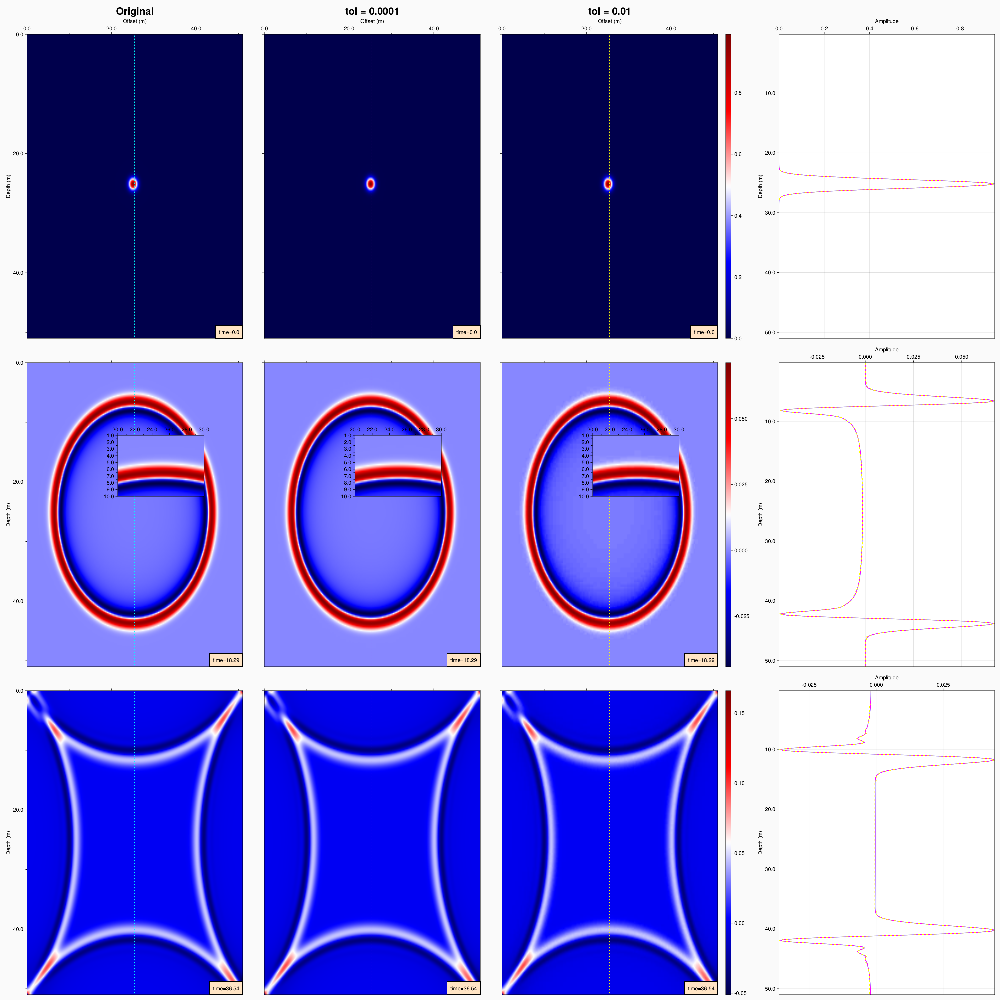

In [10]:
CairoMakie.activate!()
using CairoMakie
using SequentialCompression
using JSON


function collage(Aoriginal::SequentialCompression.AbstractCompArraySeq,
                 geometry::Dict,
                 numberOfSnapshots::Int=3;
                 tol1::Real=0,
                 tol2::Real=0,
                 inmemory::Bool=true,
                 boxes::Tuple=())

    @assert length(boxes) == numberOfSnapshots

    Acomp1 = SeqCompressor(Float64, size(Aoriginal)[1:2]..., inmemory=false, tol=tol1)
    Acomp2 = SeqCompressor(Float64, size(Aoriginal)[1:2]..., inmemory=false, tol=tol2)

    ny, nx, nt = size(Aoriginal)

    for it = 1:nt
        append!(Acomp1, Aoriginal[it])
        append!(Acomp2, Aoriginal[it])
    end

    N = numberOfSnapshots
    M = 3

    size_in_inches = (5, 5)
    dpi = 600
    size_in_pixels = size_in_inches .* dpi
    fig = Figure(backgroundcolor=RGBf(0.98, 0.98, 0.98), resolution=size_in_pixels)

    it = range(1, 3//4*nt|>round|>Int, length=N)
    axisOptions = (:yreversed => true,
                   :xaxisposition => :top,
                   :xminorticksvisible => true,
                   :yminorticksvisible => true,
                   :ytickformat => x -> string.(round.(geometry["dy"] .* x, digits=2)),
                   :xtickformat => x -> string.(round.(geometry["dx"] .* x, digits=2)),
                   :titlesize => 30,
                  )

    for (n, it) in zip(1:N, it)
        it = round(it)
        vmax = maximum(Aoriginal[Int(it)])
        vmin = minimum(Aoriginal[Int(it)])

        time = geometry["dt"] * (it - 1)
        time = round(time, digits=2)

        ax1 = Axis(fig[n,1]; axisOptions..., ylabel="Depth (m)")
        ax2 = Axis(fig[n,2]; axisOptions...)
        ax3 = Axis(fig[n,3]; axisOptions...)

        # This is a hack to get the time label in the bottom right corner
        for m = 1:3
            gl = GridLayout(fig[n, m], tellwidth = false, tellheight = false, halign = :right, valign = :bottom)
            Box(gl[1, 1], color = :bisque, strokecolor = :black, strokewidth = 2)
            Label(gl[1, 1], "time=$(time)", padding = (10, 10, 10, 10))
        end

        if n == 1
            ax1.title = "Original"
            ax2.title = "tol = $(tol1)"
            ax3.title = "tol = $(tol2)"
            for ax in (ax1, ax2, ax3)
                ax.xlabel = "Offset (m)"
            end
        else
            for ax in (ax1, ax2, ax3)
                hidexdecorations!(ax, ticks=false, minorticks=false, grid=false)
            end
        end

        hideydecorations!(ax2, ticks=false, grid=false)
        hideydecorations!(ax3, ticks=false, grid=false)

        img1 = image!(ax1, Aoriginal[Int(it)]; colorrange=(vmin,vmax), colormap=:seismic)
        image!(ax2, Acomp1[Int(it)]; colorrange=(vmin,vmax), colormap=:seismic)
        image!(ax3, Acomp2[Int(it)]; colorrange=(vmin,vmax), colormap=:seismic)

        # Insets
        if boxes[n] != false
            ax1Inset = Axis(fig[n,1]; axisOptions..., boxes[n]...)
            ax2Inset = Axis(fig[n,2]; axisOptions..., boxes[n]...)
            ax3Inset = Axis(fig[n,3]; axisOptions..., boxes[n]...)
            image!(ax1Inset, Aoriginal[Int(it)]; colorrange=(vmin,vmax), colormap=:seismic)
            image!(ax2Inset, Acomp1[Int(it)]; colorrange=(vmin,vmax), colormap=:seismic)
            image!(ax3Inset, Acomp2[Int(it)]; colorrange=(vmin,vmax), colormap=:seismic)
        end
        # ax2Inset = Axis(fig[n,2]; axisOptions...)
        # ax3Inset = Axis(fig[n,3]; axisOptions...)

        Colorbar(fig[n,4], img1)

        colors = [:cyan, :magenta, :yellow]
        lines!(ax1, [nx÷2, nx÷2], [1, ny], color=colors[1], linewidth=1.5, linestyle=:dash)
        lines!(ax2, [nx÷2, nx÷2], [1, ny], color=colors[2], linewidth=1.5, linestyle=:dash)
        lines!(ax3, [nx÷2, nx÷2], [1, ny], color=colors[3], linewidth=1.5, linestyle=:dash)

        ax4 = Axis(fig[n,5], ylabel="Depth (m)", xlabel="Amplitude", yreversed = true,
                   xaxisposition = :top,
                   ytickformat = x -> string.(round.(geometry["dy"] .* x, digits=2)),
                   yautolimitmargin=(0,0), xautolimitmargin=(0,0))

        lines!(ax4, Aoriginal[Int(it)][:, nx÷2], 1:ny, color=colors[1], linewidth=2, linestyle=:solid, label="Original")
        lines!(ax4, Acomp1[Int(it)][:, nx÷2], 1:ny, color=colors[2], linewidth=2, linestyle=:solid, label="tol = $(tol1)")
        lines!(ax4, Acomp2[Int(it)][:, nx÷2], 1:ny, color=colors[3], linewidth=2, linestyle=:dash, label="tol = $(tol2)")
    end

    display(fig)
    CairoMakie.save("../figs/collage.png", fig)

    return nothing
end

Aoriginal = load("./wavefield.szfp")

geometry = open("./geometry.json") do file
    JSON.parse(file)
end

idx_x(x) = x / geometry["dx"]
idx_y(y) = y / geometry["dy"]

boxes = (
            false,
            Dict(
                :width=>Relative(0.4),
                :height=>Relative(0.2),
                :halign=>0.7,
                :valign=>0.7,
                :limits=>(idx_x(20), idx_x(30), idx_y(1), idx_y(10))
            ),
            false
        )

collage(Aoriginal, geometry, tol1=1e-4, tol2=1e-2, boxes=boxes)

In [11]:
using WGLMakie
WGLMakie.activate!()
using SequentialCompression

function makemovie(A::SequentialCompression.AbstractCompArraySeq, videoFilePath::String)
    fig = Figure(backgroundcolor=RGBf(0.98, 0.98, 0.98))
    ax = Axis(fig[1,1])

    iter = Observable(1)
    img = @lift(image!(ax, A[$iter]))

    framerate = 30

    iterations = 1:size(A)[3]

    display(fig)

    if !occursin(".mkv", videoFilePath)
        videoFilePath *= ".mkv"
    end

    record(fig, videoFilePath, iterations;
           framerate=framerate) do it
        iter[] = it
    end

    return nothing
end

A = load("./wavefield.szfp")
makemovie(A, "wavemovie")

LoadError: Can't get three: Timed out waiting 100s for session to get initilize
Plot needs to be displayed to insert additional plots